In [3]:
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

from tensorflow import keras
from keras.models import Sequential
from IPython.display import Audio
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score

# Librosa (the mother of audio files)

import librosa # analyze audio signals and also includes the nuts and bolts to build a MIR(Music information retrieval) system.
import IPython.display as ipd # plays audio directly in a jupyter notebook.
import librosa.display
import warnings
warnings.filterwarnings('ignore')

Genres/Dataset Information

In [4]:
# list of all the genre available in the dataset
general_path = 'Data'
print(list(os.listdir(f'{general_path}/genres_original/')))

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


Exploring Audio files

In [5]:
# x - sound, sr - sampling rate - number of samples of audio carried per second, measured in Hz or kHz.
x, sample_rate = librosa.load(f'{general_path}/genres_original/blues/blues.00000.wav')
print('Sound:', x, '\n')
print('Sound length:', np.shape(x), '\n')
print('Sample Rate (Hz):', sample_rate, '\n')


Sound: [ 0.00732422  0.01660156  0.00762939 ... -0.05560303 -0.06106567
 -0.06417847] 

Sound length: (661794,) 

Sample Rate (Hz): 22050 



In [6]:
audio_path = f"{general_path}/genres_original/blues/blues.00000.wav"
ipd.Audio(x, rate=sample_rate) # Defualt sr as of now = 22050


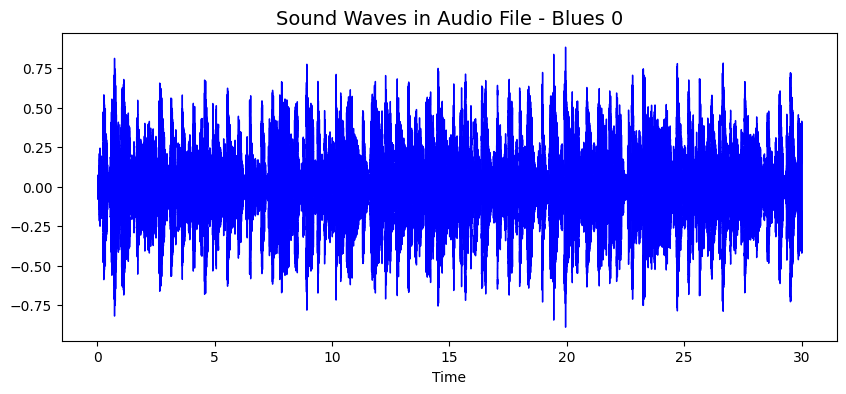

In [7]:
plt.figure(figsize = (10, 4))
librosa.display.waveshow(y = x, sr = sample_rate, color = "#0000ff");
plt.title("Sound Waves in Audio File - Blues 0", fontsize = 14);

The Spectrogram - is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams

Here we convert the frequency axis to a logarithmic one.

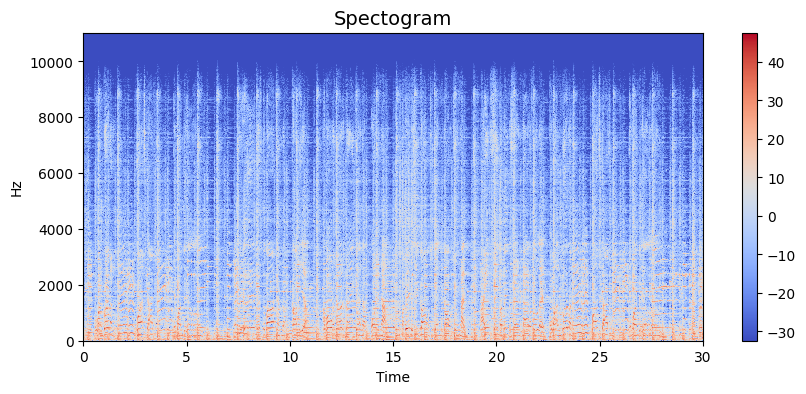

In [8]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(10, 4))
librosa.display.specshow(Xdb, sr=sample_rate, x_axis='time', y_axis='hz')
plt.title("Spectogram", fontsize = 14);
plt.colorbar()

Harmonics and Perceptrual

    -   Harmonics are characteristichs that human years can't distinguish (represents the sound color)

    -   Perceptrual understanding shock wave represents the sound rhythm and emotion

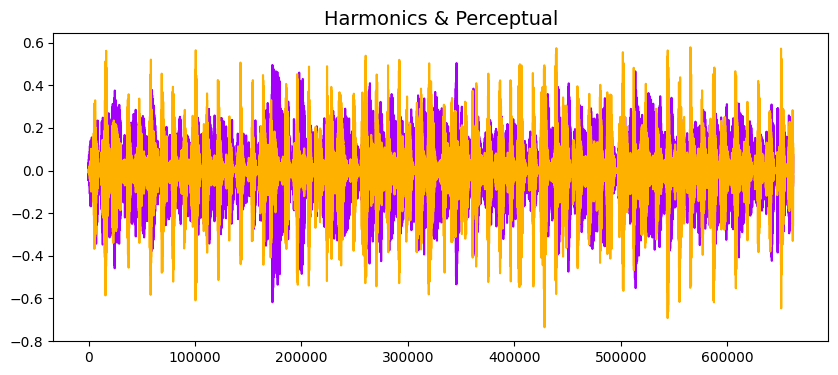

In [9]:
y_harm, y_perc = librosa.effects.hpss(x)
plt.figure(figsize = (10, 4))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');
plt.title("Harmonics & Perceptual", fontsize = 14);


Zero Crossing Rate

    -   the rate at which the signal changes from positive to negative or back.

In [10]:

# Total zero_crossings in our 1 song
zero_crossings = librosa.zero_crossings(x, pad=False)
print(sum(zero_crossings))

55031


Tempo BMP (beats per minute)

    - Dynamic programming beat tracker.

In [11]:
tempo, _ = librosa.beat.beat_track(y = x, sr = sample_rate)
print("Path of audio file: ",audio_path)
print("Beats per second: ",tempo)

Path of audio file:  Data/genres_original/blues/blues.00000.wav
Beats per second:  123.046875


Spectral Centroid - indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound.

In [12]:
# Calculate the Spectral Centroids
spectral_centroids = librosa.feature.spectral_centroid(y = x, sr=sample_rate)[0]

# Shape is a vector
print('Centroids:', spectral_centroids, '\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

# Computing the time variable for visualization
frames = range(len(spectral_centroids))
# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [2122.97749428 2102.62106711 1955.28567059 ... 1490.45683883 1507.40420474
 1439.64315882] 

Shape of Spectral Centroids: (1293,) 

frames: range(0, 1293) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


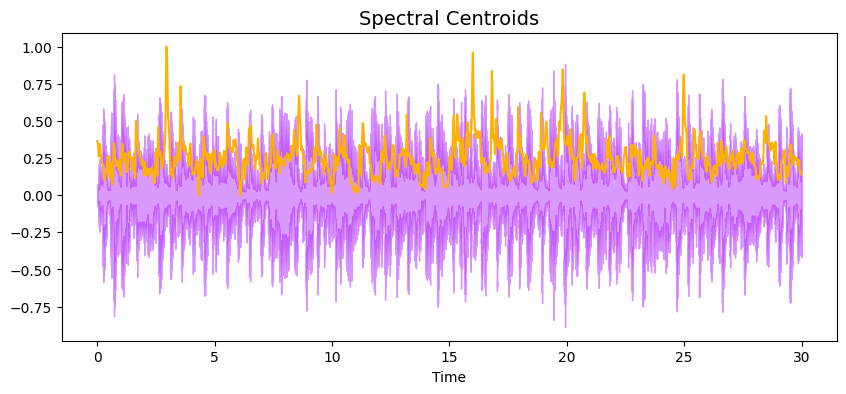

In [13]:
#Plotting the Spectral Centroid along the waveform
plt.figure(figsize = (10, 4))
librosa.display.waveshow(x, sr=sample_rate, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_centroids), color='#FFB100');
plt.title("Spectral Centroids", fontsize = 14);


Mel-Frequency Cepstral Coefficients:

    -   The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

mfccs shape: (20, 1293)


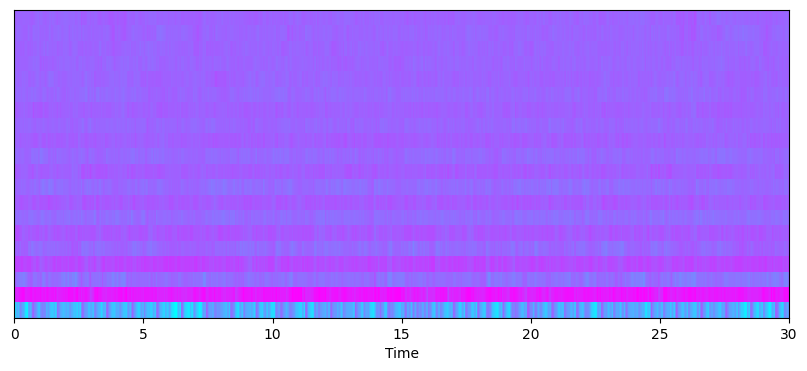

In [14]:
mfccs = librosa.feature.mfcc(y = x, sr=sample_rate)
print('mfccs shape:', mfccs.shape)

#Displaying  the MFCCs:
plt.figure(figsize = (10, 4))
librosa.display.specshow(mfccs, sr=sample_rate, x_axis='time', cmap = 'cool');

Chroma Frequencies:

    -   Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

Chromogram shape: (12, 133)


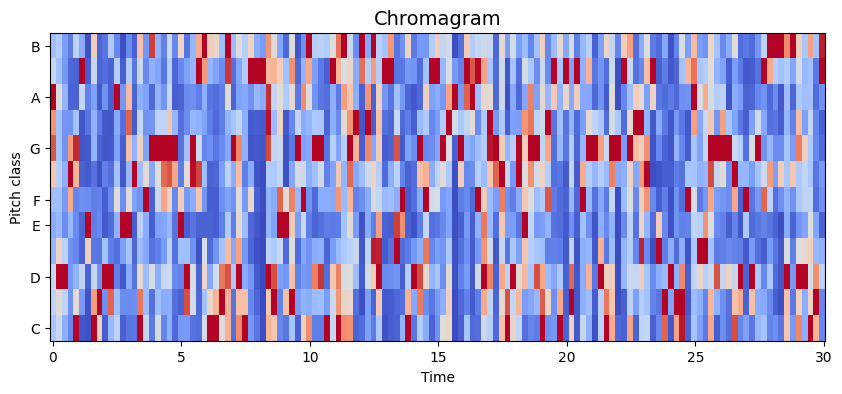

In [15]:
# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000

# Chromogram
chromagram = librosa.feature.chroma_stft(y = x, sr=sample_rate, hop_length=hop_length)
print('Chromogram shape:', chromagram.shape)

plt.figure(figsize=(10, 4))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm');
plt.title("Chromagram", fontsize = 14);


EDA

    -   EDA is going to be performed on the features_3_sec.csv. This file contains the mean and variance for each audio file fo the features analysed above.

    -   So, the table has a final of 1000 rows (10 genrex x 100 audio files) and 60 features (dimensionalities).

In [16]:
data = pd.read_csv(f'{general_path}/features_3_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


Correlation Heat map

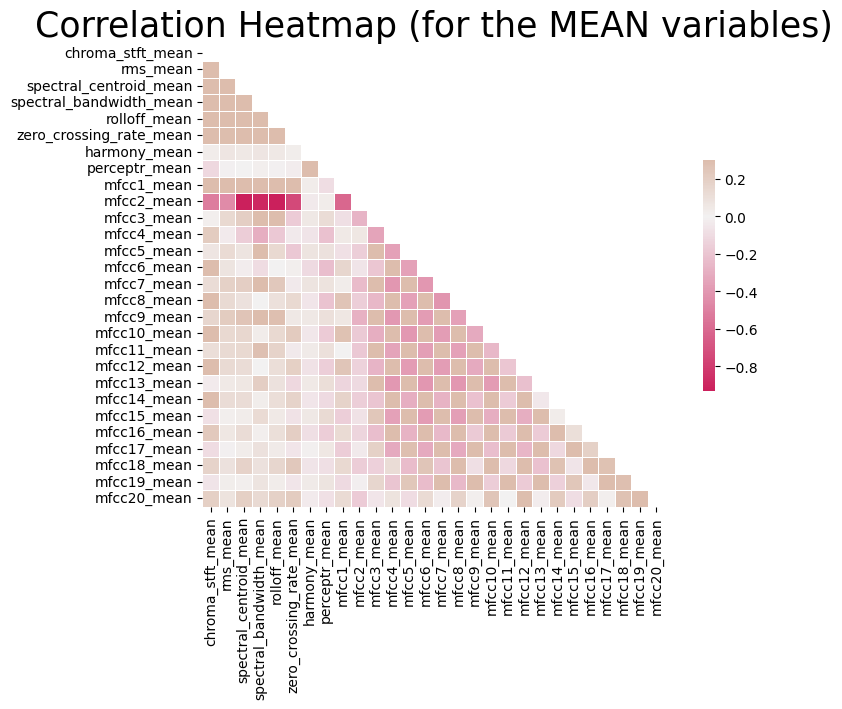

In [17]:
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 6));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);
# plt.savefig("Corr Heatmap.jpg")

EXTRACTING AND SCALING THE FEATURES

In [18]:
final_df = data.drop(labels='filename',axis=1)


In [19]:
#To convert categorical data into model-understandable numerica data
class_list = final_df.iloc[:, -1]
convertor = LabelEncoder()

In [20]:
#Fitting the label encoder & return encoded labels
y = convertor.fit_transform(class_list)

In [21]:
y

array([0, 0, 0, ..., 9, 9, 9])

In [22]:
print(final_df.iloc[:, :-1])

      length  chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
0      66149          0.335406         0.091048  0.130405  0.003521   
1      66149          0.343065         0.086147  0.112699  0.001450   
2      66149          0.346815         0.092243  0.132003  0.004620   
3      66149          0.363639         0.086856  0.132565  0.002448   
4      66149          0.335579         0.088129  0.143289  0.001701   
...      ...               ...              ...       ...       ...   
9985   66149          0.349126         0.080515  0.050019  0.000097   
9986   66149          0.372564         0.082626  0.057897  0.000088   
9987   66149          0.347481         0.089019  0.052403  0.000701   
9988   66149          0.387527         0.084815  0.066430  0.000320   
9989   66149          0.369293         0.086759  0.050524  0.000067   

      spectral_centroid_mean  spectral_centroid_var  spectral_bandwidth_mean  \
0                1773.065032          167541.630869              19

In [23]:
#Standard scaler is used to standardize features & look like standard normally distributed data
fit = StandardScaler()
X = fit.fit_transform(np.array(final_df.iloc[:, :-1], dtype = float))

Splitting

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [25]:
print("Length of Train Set:", len(y_train))
print("Length of Test Set:", len(y_test))

Length of Train Set: 6693
Length of Test Set: 3297


In [26]:
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

def trainModel(model, epochs, optimizer):
    batch_size = 128
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    
    
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)
    
    return model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, 
                     batch_size=batch_size, callbacks=[early_stopping, reduce_lr])

In [27]:
#Plotting the curves
def plotValidate(history):
    print("Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(10,4))
    plt.show()
    

In [28]:
model = keras.models.Sequential([
    keras.layers.Dense(512, activation="relu", input_shape=(X_train.shape[1],)),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(256,activation="relu"),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(128,activation="relu"),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(64,activation="relu"),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(10, activation="softmax"),
    
])
print(model.summary())
model_history = trainModel(model=model, epochs=100, optimizer='adam')

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 512)            │        30,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 203,338 (794.29 KB)

 Trainable params: 203,338 (794.29 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/100


53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3239 - loss: 1.9011 - val_accuracy: 0.5869 - val_loss: 1.1661 - learning_rate: 0.0010
Epoch 2/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5824 - loss: 1.2018 - val_accuracy: 0.6791 - val_loss: 0.9244 - learning_rate: 0.0010
Epoch 3/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6825 - loss: 0.9387 - val_accuracy: 0.7346 - val_loss: 0.7863 - learning_rate: 0.0010
Epoch 4/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7244 - loss: 0.8365 - val_accuracy: 0.7674 - val_loss: 0.6960 - learning_rate: 0.0010
Epoch 5/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7683 - loss: 0.7074 - val_accuracy: 0.7889 - val_loss: 0.6150 - learning_rate: 0.0010
Epoch 6/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7908 - loss: 0.6419 - val_accuracy: 0.8062 - val_loss: 0.5848 - learning_rate: 0.0010
Epoch 7/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8077 - loss: 0.5837 - val_accuracy: 0.81

In [29]:
test_loss, test_accuracy = model.evaluate(X_test, y_test, batch_size=128)
print("The test loss is :",test_loss)
print("\nThe test Accuracy is :",test_accuracy*100)

26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9057 - loss: 0.3707
The test loss is : 0.3416203260421753

The test Accuracy is : 90.80982804298401


Validation Accuracy 0.9096148014068604


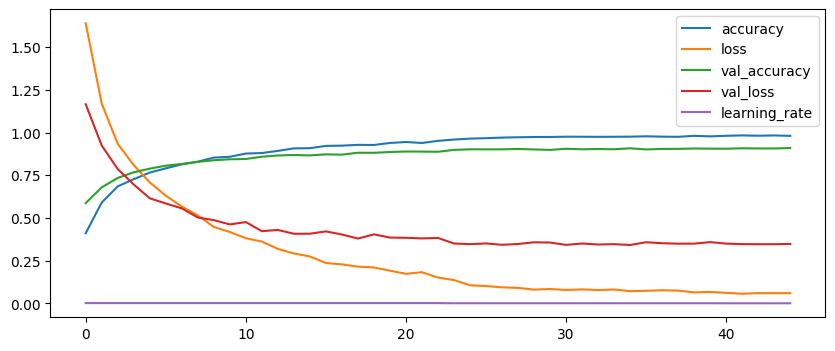

In [30]:
#Plot the loss & accuracy curves for training & validation
plotValidate(model_history)

In [31]:
predictions = model.predict(X_test)

# Get class names from LabelEncoder
class_names = convertor.inverse_transform(range(10))


104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [32]:
def predict_genre(i):
    # Get predicted and actual genre
    predicted_genre = class_names[np.argmax(predictions[i])]
    actual_genre = class_names[y_test[i]]
    
    # Get filepath for the current test sample
    filepath = f"{general_path}/genres_original/{actual_genre}/{actual_genre}.{i:05}.wav"
    
    # Display information
    print(f"Predicted genre: {predicted_genre}")
    print(f"Actual genre: {actual_genre}")
    print(f"Filepath: {filepath}")
    
    # Display audio
    display(Audio(filepath))


In [33]:
for i in range(3):
    predict_genre(i)


Predicted genre: rock
Actual genre: metal
Filepath: Data/genres_original/metal/metal.00000.wav


Predicted genre: blues
Actual genre: blues
Filepath: Data/genres_original/blues/blues.00001.wav


Predicted genre: pop
Actual genre: pop
Filepath: Data/genres_original/pop/pop.00002.wav


In [34]:
import random

# Define the number of random predictions you want to display
num_random_predictions = 3

# Generate random indices for predictions
random_indices = random.sample(range(len(y_test)), num_random_predictions)

# Loop through the random indices and display predictions
for i in random_indices:
    # Get predicted and actual genre
    predicted_genre = class_names[np.argmax(predictions[i])]
    actual_genre = class_names[y_test[i]]
    
    # Count the number of files for the current genre
    num_files_per_genre = 100
    
    # Calculate the correct index within the current genre
    index_in_genre = i % num_files_per_genre
    
    # Get filepath for the current test sample
    filepath = f"{general_path}/genres_original/{actual_genre}/{actual_genre}.{index_in_genre:05}.wav"
    
    # Display information
    print(f"Predicted genre: {predicted_genre}")
    print(f"Actual genre: {actual_genre}")
    print(f"Filepath: {filepath}")
    
    # Load audio file and display
    audio_data, sample_rate = librosa.load(filepath, sr=None)
    display(Audio(audio_data, rate=sample_rate))

Predicted genre: reggae
Actual genre: reggae
Filepath: Data/genres_original/reggae/reggae.00041.wav


Predicted genre: metal
Actual genre: metal
Filepath: Data/genres_original/metal/metal.00004.wav


Predicted genre: classical
Actual genre: classical
Filepath: Data/genres_original/classical/classical.00053.wav
